# Air Quality Data EDA and Trends
Air is what keeps humans alive. Monitoring it and understanding its quality is of immense importance to our well-being. The dataset contains air quality data and AQI (Air Quality Index) at hourly and daily level of various stations across multiple cities in India.

## Cities
Amaravati Guwahati Patna Chandigarh Delhi Ahmedabad Gurugram Jorapokhar Bengaluru Thiruvananthapuram Mumbai Shillong Bhopal Aizawl Brajrajnagar Talcher Amritsar Jaipur Hyderabad Chennai Lucknow Kolkata

In this project you will learn EDA using plotly library

## Importing the Libraries

In [31]:
# importing the OS library
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [32]:
# import other libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from pandas_profiling import ProfileReport
%matplotlib inline

## Reading the CSV file

In [33]:
#reading in the data
data = pd.read_csv('city_day.csv')
data.head(10)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,NaN,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,NaN,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,NaN,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,NaN,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,NaN,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
5,Ahmedabad,2015-01-06,NaN,NaN,NaN,38.48,81.50,NaN,45.41,45.76,46.51,5.42,10.83,1.93,NaN,NaN
6,Ahmedabad,2015-01-07,NaN,NaN,NaN,40.62,130.77,NaN,112.16,32.28,33.47,0.00,0.00,0.00,NaN,NaN
7,Ahmedabad,2015-01-08,NaN,NaN,NaN,36.74,96.75,NaN,80.87,38.54,31.89,0.00,0.00,0.00,NaN,NaN
8,Ahmedabad,2015-01-09,NaN,NaN,NaN,31.00,48.00,NaN,29.16,58.68,25.75,0.00,0.00,0.00,NaN,NaN
9,Ahmedabad,2015-01-10,NaN,NaN,NaN,7.04,0.00,NaN,NaN,8.29,4.55,0.00,0.00,0.00,NaN,NaN


In [4]:
# creating a new year column
data['Date'] = pd.to_datetime(data['Date'])
data['year'] = data['Date'].dt.year

# Report of Air Quality Data in India

In [5]:
# Generating the Report of the DATA using Pandas_profiling library
from pandas_profiling import ProfileReport
report = ProfileReport(data)
report

# How AQI(air quality index) is distributed?

/home/kartik/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/home/kartik/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


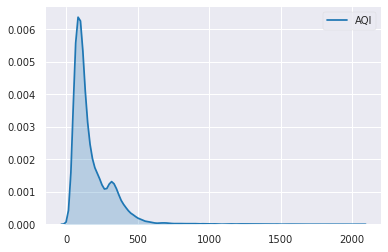

In [6]:
# a basic distribution plot of AQI
sns.set_style("darkgrid")
sns.kdeplot(data=data['AQI'],label="AQI" ,shade=True)

# Which city has lowest AQI?

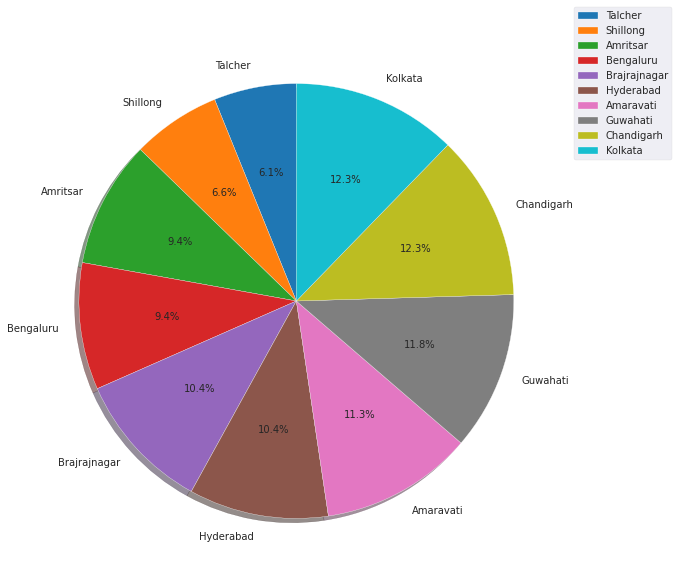

In [7]:
# City wise AQI pie chart for lowest AQI per year
aqi = data.groupby('City')['AQI'].min().reset_index()
aqi  = aqi.sort_values("AQI")
aqi = aqi.head(10)
fig1, ax1 = plt.subplots(figsize=(15,10))
ax1.pie(aqi['AQI'].tolist(), labels=aqi['City'].tolist(), autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.legend(loc='right',bbox_to_anchor=(1.2,0.9))
plt.show()

# Cities with lowest AQI per year

In [9]:
# a histogram representing cities having lowest AQI per year
perc = data.loc[:,["year","City",'AQI']]
perc['mean_AQI'] = perc.groupby([perc.City,perc.year])['AQI'].transform('mean')
perc.drop('AQI', axis=1, inplace=True)
perc = perc.drop_duplicates()
perc = perc.sort_values("year",ascending = False)
top_brand = ['Talcher','Amritsar','Brajrajnagar'] 
perc = perc.loc[perc['City'].isin(top_brand)]
perc = perc.sort_values("year")
perc = perc.fillna(100)
fig=px.bar(perc,x='City', y="mean_AQI", animation_frame="year", 
           animation_group="City", color="City", hover_name="City")
fig.show()

# Which City has highest AQI?

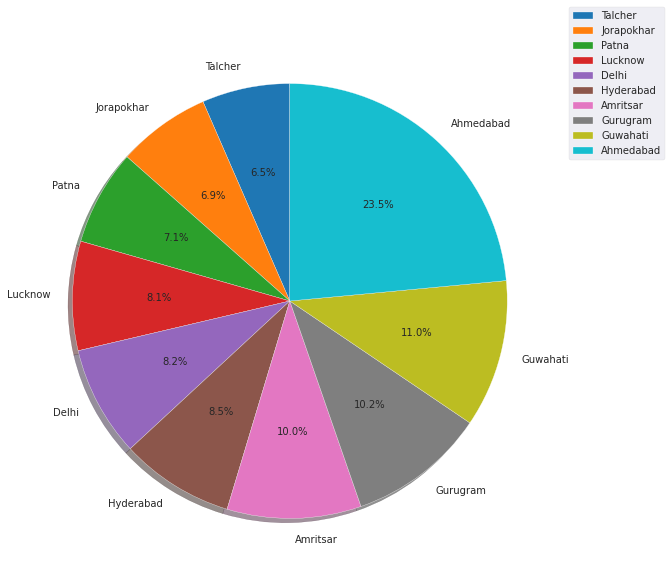

In [12]:
# city wise pie chart with highest AQI per year
aqi = data.groupby('City')['AQI'].max().reset_index()
aqi  = aqi.sort_values("AQI")
aqi = aqi.tail(10)
fig1, ax1 = plt.subplots(figsize=(15,10))
ax1.pie(aqi['AQI'].tolist(), labels=aqi['City'].tolist(), autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.legend(loc='right',bbox_to_anchor=(1.2,0.9))
plt.show()

# Cities with highest AQI per year

In [13]:
# histogram for top 3 cities with hightse AQI year wise
perc = data.loc[:,["year","City",'AQI']]
perc['mean_AQI'] = perc.groupby([perc.City,perc.year])['AQI'].transform('mean')
perc.drop('AQI', axis=1, inplace=True)
perc = perc.drop_duplicates()
perc = perc.sort_values("year",ascending = False)
top_brand = ['Hyderabad','Amritsar','Gurugram','Guwahati',"Ahmedabad"] 
perc = perc.loc[perc['City'].isin(top_brand)]
perc = perc.sort_values(by="year")
perc = perc.fillna(100)
fig=px.bar(perc,x='City', y="mean_AQI", animation_frame="year", 
           animation_group="City", color="City", hover_name="City")
fig.show()

# Looking at each of the cities with highest AQI

In [14]:
data.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,year
0,Ahmedabad,2015-01-01,NaN,NaN,NaN,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN,2015
1,Ahmedabad,2015-01-02,NaN,NaN,NaN,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN,2015
2,Ahmedabad,2015-01-03,NaN,NaN,NaN,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN,2015
3,Ahmedabad,2015-01-04,NaN,NaN,NaN,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN,2015
4,Ahmedabad,2015-01-05,NaN,NaN,NaN,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN,2015


In [15]:
# group the city columns and take the mean AQI values
data1 = data['AQI'].dropna()
top_10_city = data.loc[data1.index].groupby('City')['AQI'].mean().reset_index()
top_10_city.sort_values('AQI', ascending=False, inplace=True)
top_10_city.head(10)

,City,AQI
0,Ahmedabad,473.912281
9,Delhi,262.255086
18,Patna,248.270153
10,Gurugram,230.518600
16,Lucknow,222.881833
20,Talcher,179.990506
14,Jorapokhar,162.746009
11,Guwahati,156.486683
15,Kolkata,151.535714
6,Brajrajnagar,151.519345


# Top 10 cities with highest AQI

In [16]:
# array of top 10 cities with highest AQI
top_cities = top_10_city.head(10)['City'].tolist()
top_cities

['Ahmedabad',
 'Delhi',
 'Patna',
 'Gurugram',
 'Lucknow',
 'Talcher',
 'Jorapokhar',
 'Guwahati',
 'Kolkata',
 'Brajrajnagar']

Talcher is actually the city that once had the lowest AQI in the whole dataset in the span of 5 years. 

But when taken mean data it comes in one of the cities with highest AQI.

What this signifies is it's AQI value is increasing rapidly. Let's try to visualize its growth using a line plot over the years.

# Talcher AQI map

In [17]:
# year wise mean of AQI of city Talcher
talcher = data[data['City']=='Talcher']
data_by_year = talcher.groupby('year')['AQI'].mean().reset_index().dropna()
data_by_year.head()

,year,AQI
1,2018,185.744770
2,2019,169.023102
3,2020,201.633333


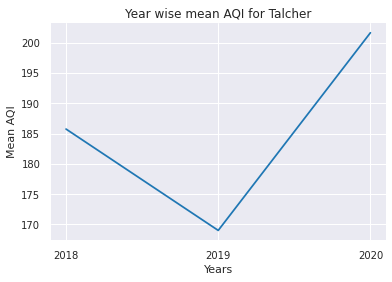

In [18]:
# Line plot of yearwise AQI of Talcher to visualize the trend
plt.plot(data_by_year['year'], data_by_year['AQI'])
plt.xticks(data_by_year['year'].tolist())
plt.title('Year wise mean AQI for Talcher')
plt.xlabel('Years')
plt.ylabel('Mean AQI')
plt.show()

The situation for talcher is not very good because it's AQI value saw a huge increase in 2020

# Brajrajnagar AQI map

In [19]:
# year wise mean of AQI of city Brajrajnagar
braj = data[data['City']=='Brajrajnagar']
data_by_year = braj.groupby('year')['AQI'].mean().reset_index().dropna()
data_by_year.head()

,year,AQI
0,2017,247.600000
1,2018,154.996154
2,2019,148.400621
3,2020,140.762500


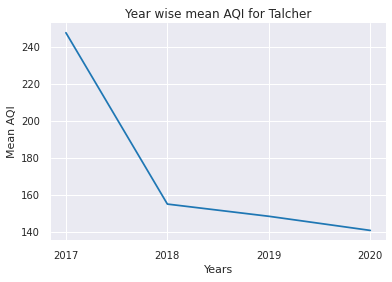

In [20]:
# Line plot of yearwise AQI of Brajrajnagar to visualize the trend
plt.plot(data_by_year['year'], data_by_year['AQI'])
plt.xticks(data_by_year['year'].tolist())
plt.title('Year wise mean AQI for Talcher')
plt.xlabel('Years')
plt.ylabel('Mean AQI')
plt.show()

Brajrajnagar may have come in top 10 cities in case of the mean but it's showing  huge progress in the last couple of years

Checking for all cities

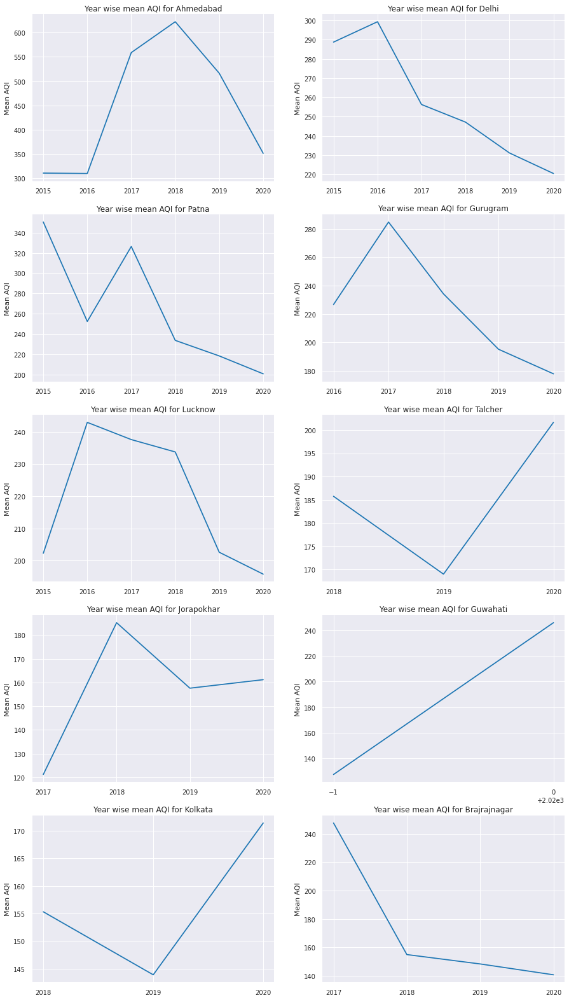

In [21]:
# Line plot of yearwise AQI of all cities to visualize the tre
fig = plt.figure(figsize=(15,28))
for city,num in zip(top_cities, range(1,11)):
    df = data[data['City']==city]
    data_by_year = df.groupby('year')['AQI'].mean().reset_index().dropna()
    ax = fig.add_subplot(5,2,num)
    ax.plot(data_by_year['year'], data_by_year['AQI'])
    ax.set_xticks(data_by_year['year'].tolist())
    ax.set_title('Year wise mean AQI for {}'.format(city))
    ax.set_ylabel('Mean AQI')

Things aren't looking good for Kolkata, Talcher and Guwahati. All other cities are improving their AQI.

I have invested enough time into understanding the AQI for each city.

Now let's move on to check the variation of the other variables(toxic factors)

# Which city has highest NO?

In [22]:
# checking the null values
data.head(2)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,year
0,Ahmedabad,2015-01-01,NaN,NaN,NaN,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN,2015
1,Ahmedabad,2015-01-02,NaN,NaN,NaN,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN,2015


Now as we can see there are a lot of null values.

One logical thing to do is to replace the NaN with 0.0 i.e, their value was not detected in that particular city.

In [23]:
#imputing null values with 0.0
df = data.fillna(0.0)

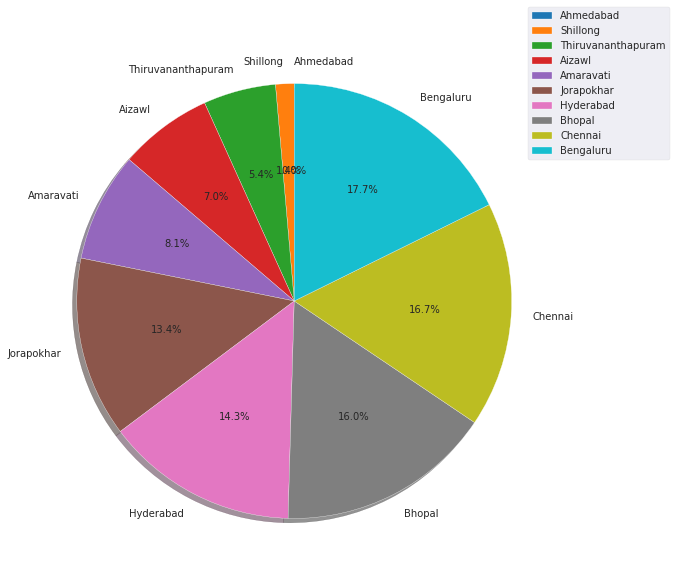

In [24]:
# city wise piechrt for NO
no = df.groupby('City')['NO'].mean().reset_index()
no  = no.sort_values("NO")
no = no.head(10)
fig1, ax1 = plt.subplots(figsize=(15,10))
ax1.pie(no['NO'].tolist(), labels=no['City'].tolist(), autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.legend(loc='right',bbox_to_anchor=(1.2,0.9))
plt.show()

In [25]:
# year wise histograms for top 3 cities
perc = df.loc[:,["year","City",'NO']]
perc['mean_NO'] = perc.groupby([perc.City,perc.year])['NO'].transform('mean')
perc.drop('NO', axis=1, inplace=True)
perc = perc.drop_duplicates()
perc = perc.sort_values("year",ascending = False)
top_brand = ['Hyderabad','Bhopal','Jorapokhar','Chennai',"Bengaluru"] 
perc = perc.loc[perc['City'].isin(top_brand)]
perc = perc.sort_values("year")
perc = perc.fillna(100)
fig=px.bar(perc,x='City', y="mean_NO", animation_frame="year", 
           animation_group="City", color="City", hover_name="City")
fig.show()

This visualization is actually not a good fit for checking all variables at once. 

Let's try with kdeplots for each country.

# Distribution of NO, NO2 and more

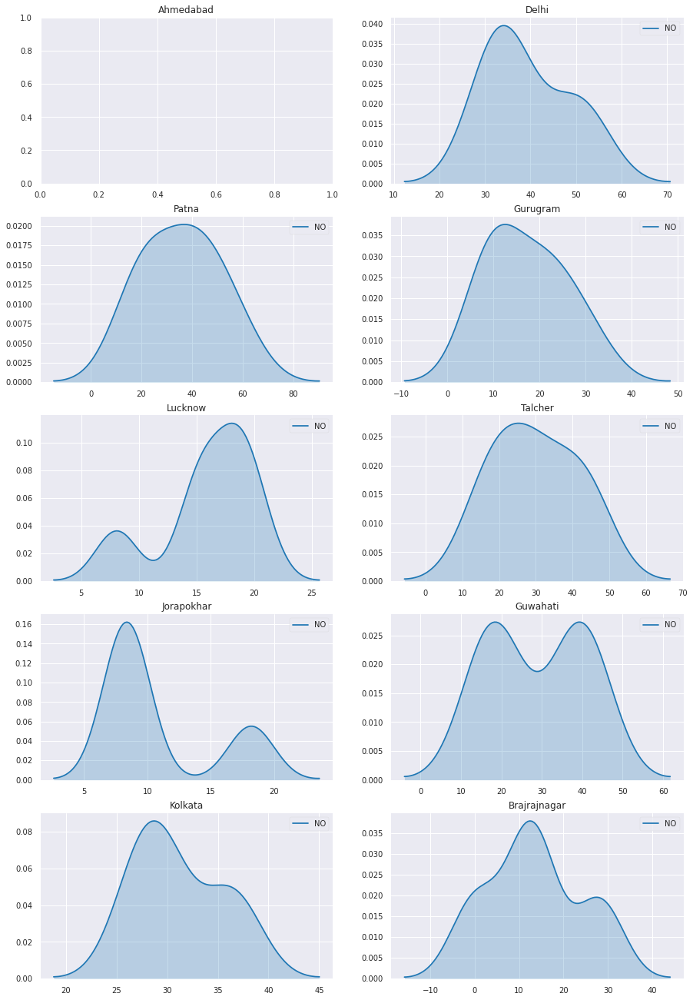

In [26]:
# city wise distribution of NO
fig = plt.figure(figsize=(15,23))
for city,num in zip(top_cities, range(1,11)):
    df = data[data['City']==city]
    df = df.groupby('year')['NO'].mean().reset_index().dropna()
    ax = fig.add_subplot(5,2,num)
    ax.set_title(city)
    sns.kdeplot(data=df['NO'],label="NO" ,shade=True)

In [27]:
data.head(2)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,year
0,Ahmedabad,2015-01-01,NaN,NaN,NaN,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN,2015
1,Ahmedabad,2015-01-02,NaN,NaN,NaN,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN,2015


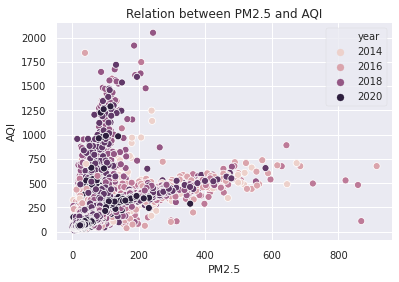

In [28]:
# Year wise scatter polt with AQI
sns.scatterplot('PM2.5', 'AQI', hue='year', data=data)
plt.title('Relation between PM2.5 and AQI')
plt.xlabel('PM2.5')
plt.ylabel('AQI')
plt.show()

Now this seems interesting. Let's plot it for each of the variables.

First the variables need to be separated.

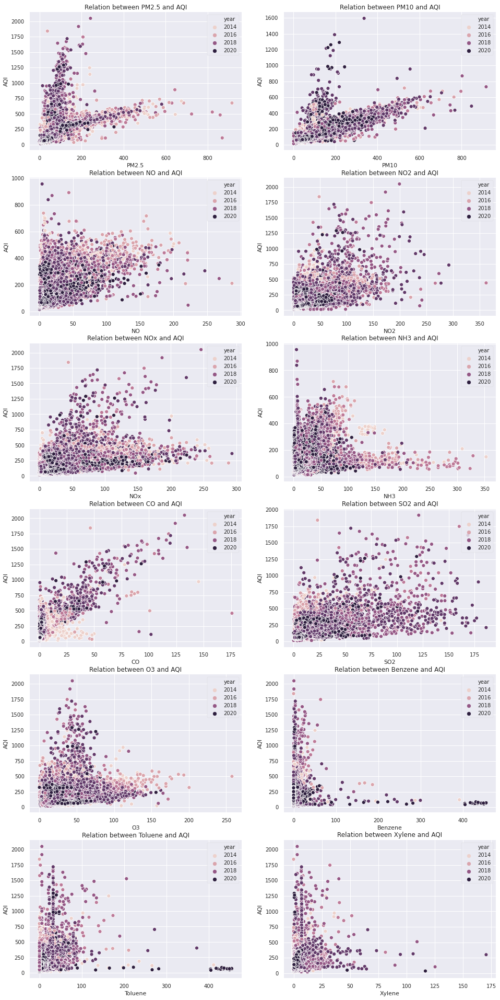

In [29]:
# scatter plots for relation between PM of each compound (NO, SO2, etc.) and AQI
variables = ['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3','Benzene','Toluene','Xylene']

fig = plt.figure(figsize=(16,34))
for variable,num in zip(variables, range(1,len(variables)+1)):
    ax = fig.add_subplot(6,2,num)
    sns.scatterplot(variable, 'AQI', hue='year', data=data)
    plt.title('Relation between {} and AQI'.format(variable))
    plt.xlabel(variable)
    plt.ylabel('AQI')

Now let's check te relations one by one for each of the variables.

1. PM2.5 -> This shows a inversely proportional behaviour since when it's value remains low the AQI value increases while in other cases when its value increases the AQI value reamins low.

2. PM10 -> This also shows an inverse behaviour except for the fact that even when PM10 value is less AQI value doesn't increase much

Similar analysis can be done for each of the other variables.

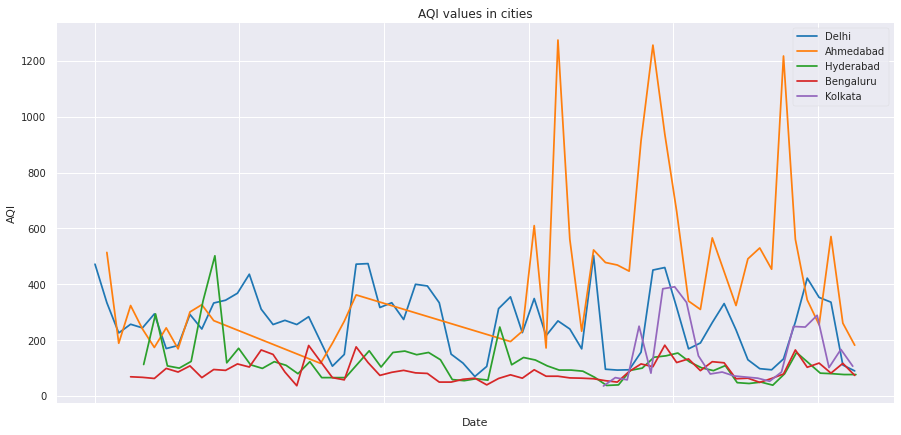

In [30]:
# Line chart of cities (AQI vs Date) for easy visualisation in trend
cities = ['Delhi', 'Ahmedabad', 'Hyderabad', 'Bengaluru', 'Kolkata']
fig,ax = plt.subplots(figsize=(15, 7))

for city in cities: 
    sns.lineplot(x="Date", y="AQI", data=data[data['City']==city].iloc[::30],label = city)

ax.set_xticklabels(ax.get_xticklabels(cities), rotation=30, ha="left")

ax.set_title('AQI values in cities')
ax.legend()